# Introduction to RadiationDetectorDSP with Julia
This notebooks contains basic information on how to use the [RadiationDetectorDSP.jl](https://github.com/JuliaPhysics/RadiationDetectorDSP.jl) for DSP processing of HPGe detectors.

First you should create an environment and load the package:

```julia
import Pkg; Pkg.add("RadiationDetectorDSP#main")
using RadiationDetectorDSP
```
If you have already an environment, you can also include there.

In [1]:
import Pkg; Pkg.activate("/home/iwsatlas1/henkes/legend/julia/legend-julia-dsp-scripts")
using RadiationDetectorDSP

  Activating project at `~/legend/julia/legend-julia-dsp-scripts`


For this example, I use a test data file from LEGEND-200 which is located at `/remote/ceph2/group/legendex/data/l60/r025/cal/tier1/tier1_l60-p01-r025-cal-20220909T190252Z.lh5`. With the `LHDataStore` function from the [LEGENDHDF5](https://github.com/legend-exp/LegendHDF5IO.jl) package, you can load and open the file: 

*For the example, I only loaded the first 1000 events in the key `ORFlashCamADCWaveform` which is LEGEND specific and can be ignored for other data files.*

In [2]:
using LegendHDF5IO
testdata = LHDataStore("/remote/ceph2/group/legendex/data/l60/r025/cal/tier1/tier1_l60-p01-r025-cal-20220909T190252Z.lh5", "r")["ORFlashCamADCWaveform"][1:1000]
testdata[1:10]

Table with 30 columns and 10 rows:
      packet_id  eventnumber  timestamp    runtime     numtraces  tracelist  ⋯
    ┌─────────────────────────────────────────────────────────────────────────
 1  │ 4          0            1.66275e9 s  0.258077 s  1          Int16[]    ⋯
 2  │ 5          0            1.66275e9 s  0.25906 s   1          Int16[]    ⋯
 3  │ 6          0            1.66275e9 s  0.258077 s  1          Int16[]    ⋯
 4  │ 7          0            1.66275e9 s  0.257607 s  1          Int16[]    ⋯
 5  │ 8          0            1.66275e9 s  0.26199 s   1          Int16[]    ⋯
 6  │ 9          1            1.66275e9 s  0.263856 s  1          Int16[]    ⋯
 7  │ 10         1            1.66275e9 s  0.259762 s  1          Int16[]    ⋯
 8  │ 11         1            1.66275e9 s  0.258399 s  1          Int16[]    ⋯
 9  │ 12         2            1.66275e9 s  0.265358 s  1          Int16[]    ⋯
 10 │ 13         0            1.66275e9 s  0.265169 s  1          Int16[]    ⋯

Now, you can get the waveforms with

In [3]:
wvfs = testdata.waveform
wvfs[1:10]

10-element StructArray(::Vector{StepRangeLen{Unitful.Quantity{Float32, 𝐓, Unitful.FreeUnits{(ns,), 𝐓, nothing}}, Unitful.Quantity{Float64, 𝐓, Unitful.FreeUnits{(ns,), 𝐓, nothing}}, Unitful.Quantity{Float64, 𝐓, Unitful.FreeUnits{(ns,), 𝐓, nothing}}, Int64}}, ::ArraysOfArrays.ArrayOfSimilarArrays{UInt16, 1, 1, 2, Matrix{UInt16}}) with eltype RadiationDetectorSignals.RDWaveform{Unitful.Quantity{Float32, 𝐓, Unitful.FreeUnits{(ns,), 𝐓, nothing}}, UInt16, StepRangeLen{Unitful.Quantity{Float32, 𝐓, Unitful.FreeUnits{(ns,), 𝐓, nothing}}, Unitful.Quantity{Float64, 𝐓, Unitful.FreeUnits{(ns,), 𝐓, nothing}}, Unitful.Quantity{Float64, 𝐓, Unitful.FreeUnits{(ns,), 𝐓, nothing}}, Int64}, Vector{UInt16}}:
 RadiationDetectorSignals.RDWaveform{Unitful.Quantity{Float32, 𝐓, Unitful.FreeUnits{(ns,), 𝐓, nothing}}, UInt16, StepRangeLen{Unitful.Quantity{Float32, 𝐓, Unitful.FreeUnits{(ns,), 𝐓, nothing}}, Unitful.Quantity{Float64, 𝐓, Unitful.FreeUnits{(ns,), 𝐓, nothing}}, Unitful.Quantity{Float64, 𝐓, Unitful.FreeU

To get a first look at the waveform, just plot the first 10 waveforms:

*If you want more fany plotting, you can use `plotyjs()`, but don't tell Oli ;)

In [4]:
using Plots 
# plotlyjs()

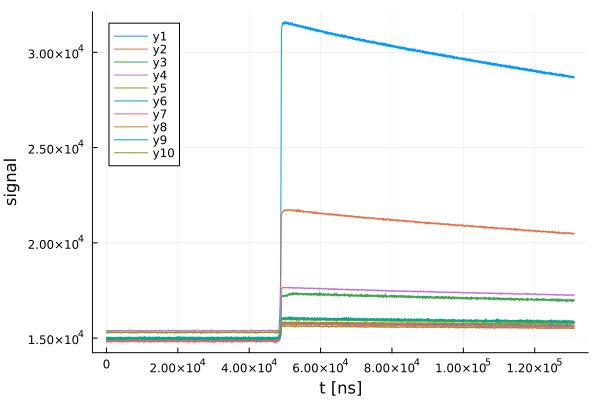

In [5]:
plot(wvfs[1:10])

First, you need to get shift the waveform down by substracting the baseline. Here, you can either use the `signalstats` function which calculates baseline mean, std and slope in a window you can define. With the `Unitful` package, you can write the window in the form of µs.

In [6]:
using Unitful
blstats = signalstats.(wvfs, 0u"µs", 39u"µs")

1000-element StructArray(::Vector{Float64}, ::Vector{Float64}, ::Vector{Quantity{Float64, 𝐓^-1, Unitful.FreeUnits{(ns^-1,), 𝐓^-1, nothing}}}, ::Vector{Float64}) with eltype NamedTuple{(:mean, :sigma, :slope, :offset), Tuple{Float64, Float64, Quantity{Float64, 𝐓^-1, Unitful.FreeUnits{(ns^-1,), 𝐓^-1, nothing}}, Float64}}:
 (mean = 14989.007383100903, sigma = 33.67055482378433, slope = -1.7955500291971465e-5 ns^-1, offset = 14989.357443534594)
 (mean = 14903.22272354389, sigma = 18.125282505727668, slope = -9.512482239540761e-5 ns^-1, offset = 14905.077277081311)
 (mean = 14886.067268252667, sigma = 27.282670715979066, slope = 0.0002846205160766312 ns^-1, offset = 14880.518306671238)
 (mean = 15384.950779327319, sigma = 12.487632822928408, slope = 2.8346646755499738e-5 ns^-1, offset = 15384.398133102173)
 (mean = 14920.270303527483, sigma = 14.93841431624656, slope = -6.742706268473691e-6 ns^-1, offset = 14920.401759328894)
 (mean = 14966.015176374078, sigma = 29.279244780199896, slope = 

Now, you can substract the baseline mean from the waveforms with the `shift_waveform` function:

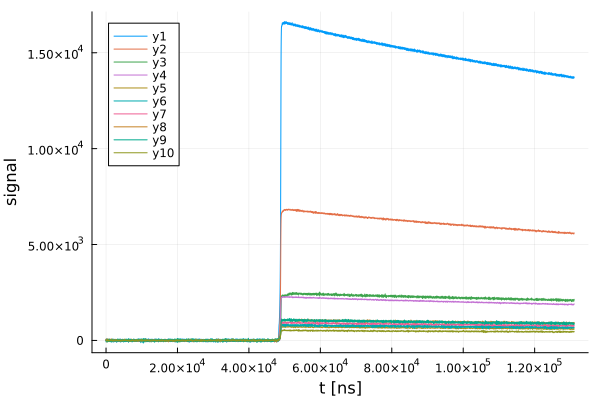

In [8]:
wvfs_bl = shift_waveform.(wvfs, -blstats.mean)
plot(wvfs_bl[1:10])

Next, you can deconvolute the waveform to remove the electronic response of the RC-feedback loop in the Charge Sensitive Amplifier (CSA).
If you have the deacy time constant extracted, you can perform the deconvolution with the `InvCRFilter` and the decay time constant as argument.

*In the example, I use a arbitrary fixed decay time constant of 450µs.*

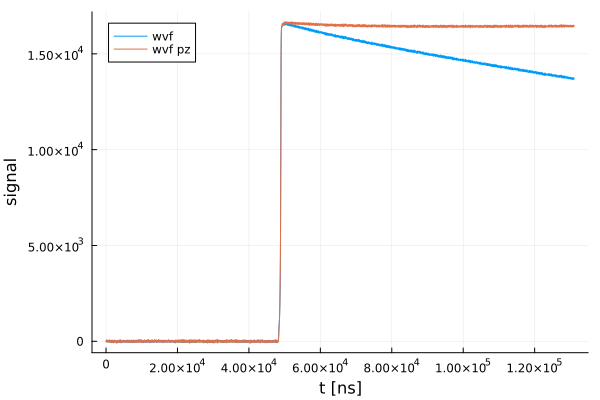

In [9]:
τ = 450u"µs"
deconv_flt = InvCRFilter(τ)
wvfs_pz = deconv_flt.(wvfs_bl)

plot(wvfs_bl[1], label="wvf")
plot!(wvfs_pz[1], label="wvf pz")

If you want to determine the $t_0$ point of the start of the drift of the charges, you can perform this with a asymetrical trapezoidal charge filter with steep rise, short flat top and long fall time. The filter is defined with the `TrapezoidalChargeFilter` and the filter parameters. In addition, the waveform is truncated with a `TruncateFilter` to get rid of the tail.

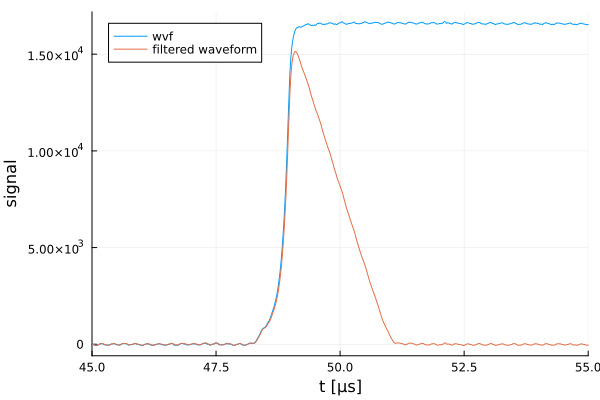

In [10]:
using IntervalSets
# define filters
uflt_asy_t0 = TrapezoidalChargeFilter(40u"ns", 100u"ns", 2000u"ns")
uflt_trunc_t0 = TruncateFilter(0u"µs"..60u"µs")

# apply filter to waveforms
wvfs_flt_asy_t0 = uflt_asy_t0.(uflt_trunc_t0.(wvfs_pz))

# plot waveform and filter
plot(u"µs", Unitful.NoUnits)
plot!(wvfs_pz[1], label="wvf")
plot!(wvfs_flt_asy_t0[1], label="filtered waveform")
xlims!(45, 55)

The $t_0$ point can then be calculated with a intersect at a fixed y-location where the waveform stays at least a certain amount of time above this threshold.

*In our example, the threshold is 5 ADC.*

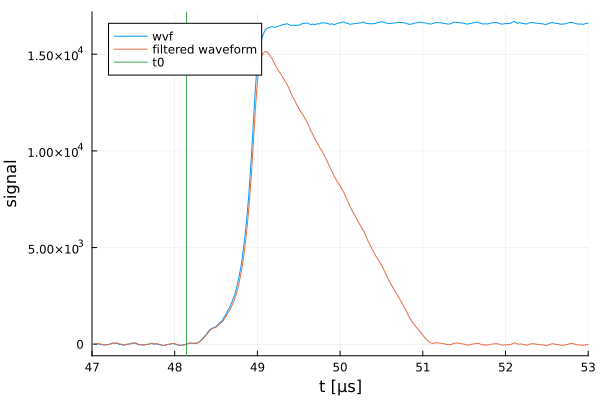

In [11]:
flt_intersec_t0 = Intersect(mintot = 600u"ns")
t0 = uconvert.(u"µs", flt_intersec_t0.(wvfs_flt_asy_t0, 5).x)
plot(u"µs", Unitful.NoUnits)
plot!(wvfs_pz[1], label="wvf")
plot!(wvfs_flt_asy_t0[1], label="filtered waveform")
vline!([t0[1]], label="t0")
xlims!(47, 53)

Following, to get the energy, you have to apply a energy filter. The simplest is the trapezoidal filter, but also the cusp and Zac filter are implemented in RaditionDetectorDSP. To apply a filter, you have to construct it first with its rise and flat top time and then apply it to the waveforms. 

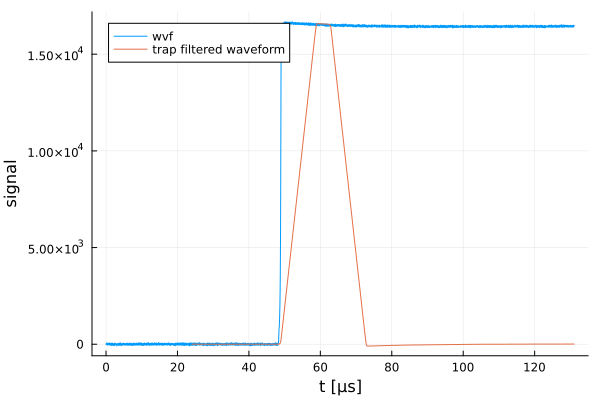

In [12]:
uflt_10410 = TrapezoidalChargeFilter(10u"µs", 4u"µs")
wvfs_flt_10410 = uflt_10410.(wvfs_pz)
plot(u"µs", Unitful.NoUnits)
plot!(wvfs_pz[1], label="wvf")
plot!(wvfs_flt_10410[1], label="trap filtered waveform")

More complicated filter is the Zac filter are implemented in RaditionDetectorDSP. To apply a filter, you have to construct it first with its rise and flat top time and then apply it to the waveforms. 

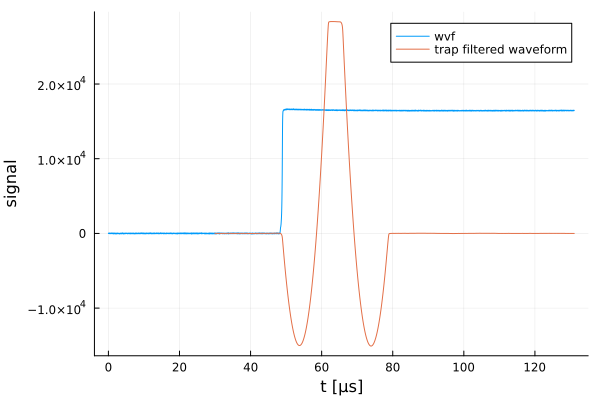

In [12]:
uflt_zac10410 = ZACChargeFilter(10u"µs", 4u"µs", 30u"µs")
wvfs_flt_zac10410 = uflt_zac10410.(wvfs_pz)
plot(u"µs", Unitful.NoUnits)
plot!(wvfs_pz[1], label="wvf")
plot!(wvfs_flt_zac10410[1], label="trap filtered waveform")
# xlims!(0, 100)

The energy is can then be extracted at a fixed loaction at the flat top relative to $t_0$ at $t_0 + t_{rise} + 0.5 \cdot t_{flat}$. For higher precision, the `SignalEstimator` can be used to do a Polynominal Regression and interpolate in a window.

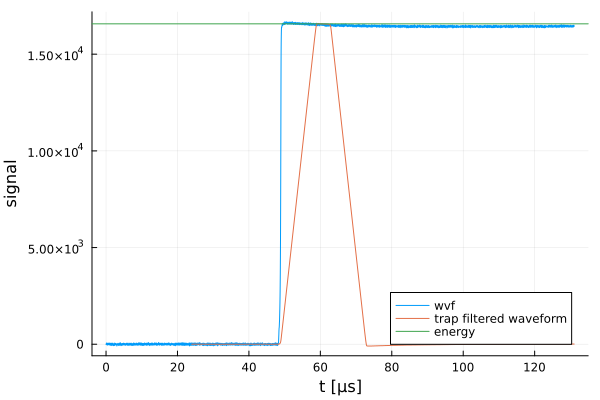

In [13]:
e_10410 = SignalEstimator(PolynomialDNI(3, 100u"ns")).(wvfs_flt_10410, t0 .+ 12u"µs")
plot(u"µs", Unitful.NoUnits)
plot!(wvfs_pz[1], label="wvf")
plot!(wvfs_flt_10410[1], label="trap filtered waveform")
hline!([e_10410[1]], label="energy", line_width=5, legend=:bottomright)

In [14]:
e_10410

1000-element Vector{Float64}:
 16571.283244305654
  6836.739276537535
  2446.39127137606
  2264.549343360934
   710.8603952596345
   792.2192298453774
   921.481150522675
  1059.7511820731024
  1062.3053348056326
   521.6822644399215
     ⋮
  1166.2714169725182
   711.2873244427799
  3844.171597137171
  1386.5655121530685
  1195.9861694333852
  1597.580652777142
  3201.009864854334
   974.6648747133048
   169.50015016568057

Finally, to extract the current for Pulse Shape analysis (PSA), you can use a Savitzky-Golay for waveform smoothng and take the maximum of the derivative as $A$ parameter for the $A/E$ analysis.

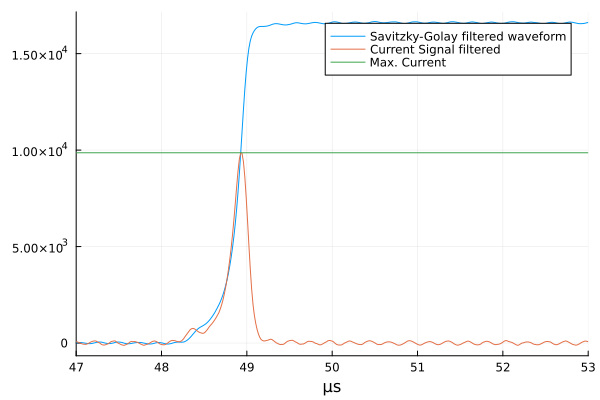

In [15]:
sgflt_deriv = SavitzkyGolayFilter(180u"ns", 2, 1)
sgflt_noderiv = SavitzkyGolayFilter(180u"ns", 2, 0)
wvfs_sgflt_deriv = sgflt_deriv.(wvfs_pz)
wvfs_sgflt_noderiv = sgflt_noderiv.(wvfs_pz)
current_max = maximum.(wvfs_sgflt_deriv.signal)[1]
wvf_max = maximum.(wvfs_sgflt_noderiv.signal)[1]
plot(u"µs", Unitful.NoUnits)
plot!(wvfs_sgflt_deriv[1].time, wvfs_sgflt_noderiv[1].signal, label="Savitzky-Golay filtered waveform")
plot!(wvfs_sgflt_deriv[1].time, wvfs_sgflt_deriv[1].signal*10, label="Current Signal filtered")
hline!([current_max*10], label="Max. Current", line_width=5, legend=:topright)
xlims!(47, 53)

Create energy grid

In [16]:
e_grid_rt = 6u"µs":0.5u"µs":12u"µs"
e_grid_ft = 1u"µs":0.2u"µs":4u"µs"
enc_pickoff = 32u"µs"

e_grid   = zeros(Float32, length(e_grid_ft), length(e_grid_rt), length(wvfs_pz))
enc_grid = zeros(Float32, length(e_grid_ft), length(e_grid_rt), length(wvfs_pz))
for (f, ft) in enumerate(e_grid_ft)
    for (r, rt) in enumerate(e_grid_rt)
        if rt < ft
            continue
        end
        uflt_rtft      = TrapezoidalChargeFilter(rt, ft)
        
        wvfs_flt_rtft  = uflt_rtft.(wvfs_pz)

        e_rtft         = SignalEstimator(PolynomialDNI(4, 80u"ns")).(wvfs_flt_rtft, t0 .+ (rt + ft/2))
        enc_rtft       = SignalEstimator(PolynomialDNI(4, 80u"ns")).(wvfs_flt_rtft, enc_pickoff)

        e_grid[f, r, :]     = e_rtft
        enc_grid[f, r, :]   = enc_rtft
    end
end

Get $Q_{drift}$ parameter.

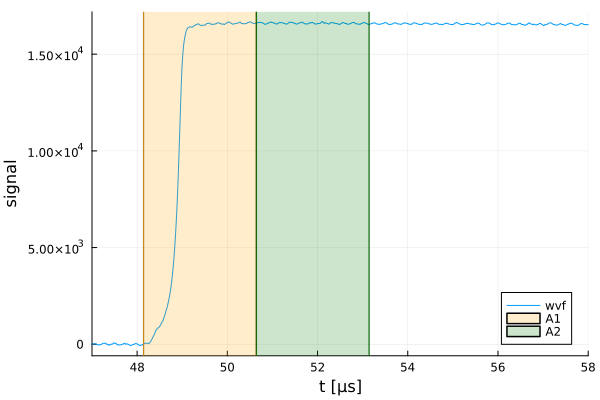

In [17]:
int_flt = IntegratorFilter(1)
wvfs_int = int_flt.(wvfs_pz)

area1 = SignalEstimator(PolynomialDNI(3, 100u"ns")).(wvfs_int, t0 .+ 2.5u"µs") .- SignalEstimator(PolynomialDNI(3, 100u"ns")).(wvfs_int, t0)
area2 = SignalEstimator(PolynomialDNI(3, 100u"ns")).(wvfs_int, t0 .+ 5u"µs")   .- SignalEstimator(PolynomialDNI(3, 100u"ns")).(wvfs_int, t0 .+ 2.5u"µs")
qdrift = area2 .- area1
plot(u"µs", Unitful.NoUnits)
plot!(wvfs_pz[1], label="wvf")
# plot!(wvfs_int[1], label="integrated waveform")
vline!([t0[1], t0[1] + 2.5u"µs"], label="", line_width=5, color=:orange)
vspan!([t0[1], t0[1] + 2.5u"µs"], fillrange=t0[1] + 2.5u"µs", lw=1.5, alpha=0.2, color=:orange, label="A1")
vline!([t0[1] + 2.5u"µs", t0[1] + 5u"µs"], label="", line_width=5, color=:green)
vspan!([t0[1] + 2.5u"µs", t0[1] + 5u"µs"], fillrange=wvfs_pz[1], lw=1.5, alpha=0.2, color=:green, label="A2")
xlims!(47, 58)

In [18]:
area2[1]

2.59389071898111e6

In [22]:
e_zac_grid   = zeros(Float32, length(e_grid_ft), length(e_grid_rt), length(wvfs_pz))
enc_zac_grid = zeros(Float32, length(e_grid_ft), length(e_grid_rt), length(wvfs_pz))
for (f, ft) in enumerate(e_grid_ft)
    for (r, rt) in enumerate(e_grid_rt)
        if rt < ft
            continue
        end
        println(rt)
        println(ft)

        uflt_zac_rtft      = ZACChargeFilter(rt, ft, 30.0u"µs")
        
        wvfs_zac_flt_rtft  = uflt_zac_rtft.(wvfs_pz)

        e_zac_rtft         = SignalEstimator(PolynomialDNI(4, 80u"ns")).(wvfs_zac_flt_rtft, t0 .+ (rt + ft/2))
        enc_zac_rtft       = SignalEstimator(PolynomialDNI(4, 80u"ns")).(wvfs_zac_flt_rtft, enc_pickoff)

        e_zac_grid[f, r, :]     = e_zac_rtft
        enc_zac_grid[f, r, :]   = enc_zac_rtft
    end
end

6.0 μs
1.0 μs


6.5 μs
1.0 μs


7.0 μs
1.0 μs


7.5 μs
1.0 μs


8.0 μs
1.0 μs


8.5 μs
1.0 μs


9.0 μs
1.0 μs


9.5 μs
1.0 μs


10.0 μs
1.0 μs


10.5 μs
1.0 μs


11.0 μs
1.0 μs


11.5 μs
1.0 μs


12.0 μs
1.0 μs


6.0 μs
1.2 μs


6.5 μs
1.2 μs


7.0 μs
1.2 μs


7.5 μs
1.2 μs


8.0 μs
1.2 μs


8.5 μs
1.2 μs


9.0 μs
1.2 μs


9.5 μs
1.2 μs


10.0 μs
1.2 μs


10.5 μs
1.2 μs


11.0 μs
1.2 μs


11.5 μs
1.2 μs


12.0 μs
1.2 μs


6.0 μs
1.4 μs


6.5 μs
1.4 μs


7.0 μs
1.4 μs


7.5 μs
1.4 μs


8.0 μs
1.4 μs


8.5 μs
1.4 μs


9.0 μs
1.4 μs


9.5 μs
1.4 μs


10.0 μs
1.4 μs


10.5 μs
1.4 μs


11.0 μs
1.4 μs


11.5 μs
1.4 μs


12.0 μs
1.4 μs


6.0 μs
1.6 μs


6.5 μs
1.6 μs


7.0 μs
1.6 μs


7.5 μs
1.6 μs


8.0 μs
1.6 μs


8.5 μs
1.6 μs


9.0 μs
1.6 μs


9.5 μs
1.6 μs


10.0 μs
1.6 μs


10.5 μs
1.6 μs


11.0 μs
1.6 μs


11.5 μs
1.6 μs


12.0 μs
1.6 μs


6.0 μs
1.8 μs


6.5 μs
1.8 μs


7.0 μs
1.8 μs


7.5 μs
1.8 μs


8.0 μs
1.8 μs


8.5 μs
1.8 μs


9.0 μs
1.8 μs


9.5 μs
1.8 μs


10.0 μs
1.8 μs


10.5 μs
1.8 μs


11.0 μs
1.8 μs


11.5 μs
1.8 μs


12.0 μs
1.8 μs


6.0 μs
2.0 μs


6.5 μs
2.0 μs


7.0 μs
2.0 μs


7.5 μs
2.0 μs


8.0 μs
2.0 μs


8.5 μs
2.0 μs


9.0 μs
2.0 μs


9.5 μs
2.0 μs


10.0 μs
2.0 μs


10.5 μs
2.0 μs


11.0 μs
2.0 μs


11.5 μs
2.0 μs


12.0 μs
2.0 μs


6.0 μs
2.2 μs


6.5 μs
2.2 μs


7.0 μs
2.2 μs


7.5 μs
2.2 μs


8.0 μs
2.2 μs


8.5 μs
2.2 μs


9.0 μs
2.2 μs


9.5 μs
2.2 μs


10.0 μs
2.2 μs


10.5 μs
2.2 μs


11.0 μs
2.2 μs


11.5 μs
2.2 μs


12.0 μs
2.2 μs


6.0 μs
2.4 μs


6.5 μs
2.4 μs


7.0 μs
2.4 μs


7.5 μs
2.4 μs


8.0 μs
2.4 μs


8.5 μs
2.4 μs


9.0 μs
2.4 μs


9.5 μs
2.4 μs


10.0 μs
2.4 μs


10.5 μs
2.4 μs


11.0 μs
2.4 μs


11.5 μs
2.4 μs


12.0 μs
2.4 μs


6.0 μs
2.6 μs


6.5 μs
2.6 μs


7.0 μs
2.6 μs


7.5 μs
2.6 μs


8.0 μs
2.6 μs


8.5 μs
2.6 μs


9.0 μs
2.6 μs


9.5 μs
2.6 μs


10.0 μs
2.6 μs


10.5 μs
2.6 μs


11.0 μs
2.6 μs


11.5 μs
2.6 μs


12.0 μs
2.6 μs


6.0 μs
2.8 μs


6.5 μs
2.8 μs


7.0 μs
2.8 μs


7.5 μs
2.8 μs


8.0 μs
2.8 μs


8.5 μs
2.8 μs


9.0 μs
2.8 μs


9.5 μs
2.8 μs


10.0 μs
2.8 μs


10.5 μs
2.8 μs


11.0 μs
2.8 μs


11.5 μs
2.8 μs


12.0 μs
2.8 μs


6.0 μs
3.0 μs


6.5 μs
3.0 μs


7.0 μs
3.0 μs


7.5 μs
3.0 μs


8.0 μs
3.0 μs


8.5 μs
3.0 μs


9.0 μs
3.0 μs


9.5 μs
3.0 μs


10.0 μs
3.0 μs


10.5 μs
3.0 μs


11.0 μs
3.0 μs


11.5 μs
3.0 μs


12.0 μs
3.0 μs


6.0 μs
3.2 μs


6.5 μs
3.2 μs


7.0 μs
3.2 μs


7.5 μs
3.2 μs


8.0 μs
3.2 μs


8.5 μs
3.2 μs


9.0 μs
3.2 μs


9.5 μs
3.2 μs


10.0 μs
3.2 μs


10.5 μs
3.2 μs


11.0 μs
3.2 μs


11.5 μs
3.2 μs


12.0 μs
3.2 μs


6.0 μs
3.4 μs


6.5 μs
3.4 μs


7.0 μs
3.4 μs


7.5 μs
3.4 μs


8.0 μs
3.4 μs


8.5 μs
3.4 μs


9.0 μs
3.4 μs


9.5 μs
3.4 μs


10.0 μs
3.4 μs


10.5 μs
3.4 μs


11.0 μs
3.4 μs


11.5 μs
3.4 μs


12.0 μs
3.4 μs


6.0 μs
3.6 μs


6.5 μs
3.6 μs


7.0 μs
3.6 μs


7.5 μs
3.6 μs


8.0 μs
3.6 μs


8.5 μs
3.6 μs


9.0 μs
3.6 μs


9.5 μs
3.6 μs


10.0 μs
3.6 μs


10.5 μs
3.6 μs


11.0 μs
3.6 μs


11.5 μs
3.6 μs


12.0 μs
3.6 μs


6.0 μs
3.8 μs


6.5 μs
3.8 μs


7.0 μs
3.8 μs


7.5 μs
3.8 μs


8.0 μs
3.8 μs


8.5 μs
3.8 μs


9.0 μs
3.8 μs


9.5 μs
3.8 μs


10.0 μs
3.8 μs


10.5 μs
3.8 μs


11.0 μs
3.8 μs


11.5 μs
3.8 μs


12.0 μs
3.8 μs


6.0 μs
4.0 μs


6.5 μs
4.0 μs


7.0 μs
4.0 μs


7.5 μs
4.0 μs


8.0 μs
4.0 μs


8.5 μs
4.0 μs


9.0 μs
4.0 μs


9.5 μs
4.0 μs


10.0 μs
4.0 μs


10.5 μs
4.0 μs


11.0 μs
4.0 μs


11.5 μs
4.0 μs


12.0 μs
4.0 μs
